Computing t-SNE clustering


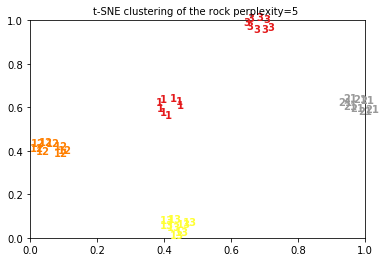

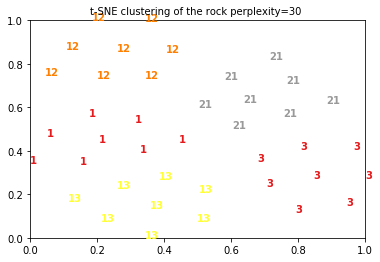

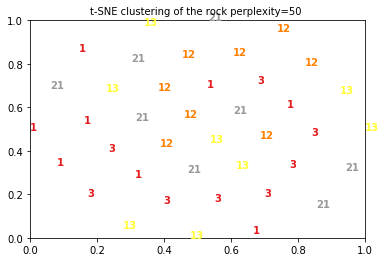

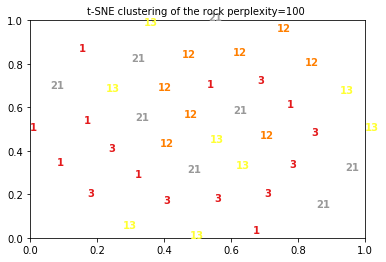

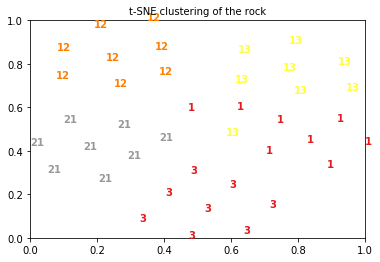

Computing random projection


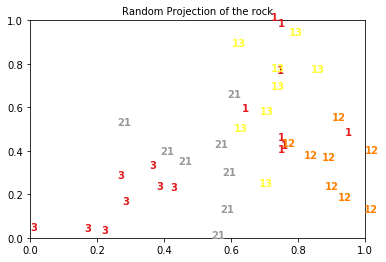

Computing PCA projection


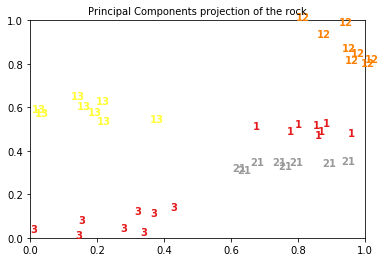

Computing MDS 
Done. Stress: 4232143.237737


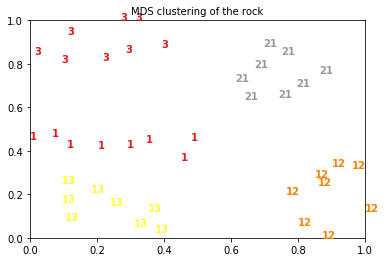

In [3]:


'''#-----------------------------------------------------------------------------------------------------------------------
#os.chdir(r"D:\\python2\\Xu_WJ_rocks\\xu\\label")
train_list = [2, 4, 13, 14, 22]
worksheet = xlrd.open_workbook(r'D:\data\Menu_Guide-quantitative.xlsx')
sheet_names= worksheet.sheet_names()
sheet_name=sheet_names[0]##选择哪个表
sheet2 = worksheet.sheet_by_name(sheet_name)
names = sheet2.row_values(0) # 元素等化合物的名字列表
# 样品的序号
nums = sheet2.col_values(names.index("Soil_Type")) # 样品的序号列表
nums.pop(0)
nums = list(map(int, nums))
# 样品的类别
labels = sheet2.col_values(names.index("Spectra_Name")) # 样品的序号列表
labels.pop(0)
#print(nums)
#-----------------------------------------------------------------------------------------------------------------------
'''
date = '20191223'
data_file_path = r'D:\data\china_2020\coeffs_cwt\coeffs_diff'
menu_guide_path = r'D:\data\Menu_Guide-quantitative.xlsx'
save_path_file = os.path.join(r'D:\data\china_2020\result\BPNN results', date, 'wavelet_diff_cluster')
if not os.path.exists(save_path_file):
    os.mkdir(save_path_file)
#process_path = ['DenoisedSpectrum', 'SmoothedSpectrum']
choose_type = 'Soil_Type'
file_list = 'Spectra_Name'
sample_list = 'Spectra_Name'
data_flag = pd.read_excel(menu_guide_path)
file_names = np.array(data_flag[file_list])
sample_type = np.array(data_flag[choose_type])
sample_name_unique = np.array(data_flag[sample_list])
train_test_set = np.array(data_flag['Train']).tolist()
type_list = data_flag[choose_type].drop_duplicates(keep='first').tolist()
p = 150  #p可调
########################################################################################################################
# train list
#train_position = [i for i, j in enumerate(train_test_set) if j == 1]
train_position = [1, 3, 12, 13, 21]
state = 'RawSpectrum'
X = None
for index_i in train_position:
    temp_sample_type = type_list.index(sample_type[index_i])
    temp_sample_name = sample_name_unique[index_i][1:]
    for j in range(8):
        file = file_names[index_i]+'_'+state+'_'+str(j)+'.txt'
        read_path = os.path.join(data_file_path, file)
        if not os.path.exists(read_path):
            print(read_path)
            continue
        data_cache = np.loadtxt(read_path)
        data_cache = data_cache.flatten()
        if X is None:
            X = data_cache
            X0 = temp_sample_type
            X2 = temp_sample_name
        else:
            X = np.row_stack((X, data_cache))
            X0 = np.row_stack((X0, temp_sample_type))
            X2 = np.row_stack((X2, temp_sample_name))


'''for filename in os.listdir(path):
    filename0 = os.path.join(path, filename)
    filename1 = os.path.join(filename0, path1)
    num = int(filename)
    label = labels[nums.index(int(filename))]
    print(filename1)
    for file in os.listdir(filename1):
        filename2 = os.path.join(filename1, file)
        data = np.loadtxt(filename2)
        if flag:
            X = np.row_stack((X, data[:, 1].T))
            X0 = np.row_stack((X0, num))
            X2 = np.row_stack((X2, label))
        else:
            X = data[:, 1].T
            X0 = num
            X2 = label
            flag = True'''

# data processing
# ---------------------------------
''''''
min_max_scaler1 = preprocessing.MinMaxScaler()
X1 = min_max_scaler1.fit_transform(X)
''''''
#X1 = X
min_max_scaler2 = preprocessing.MinMaxScaler()
X2 = min_max_scaler2.fit_transform(X2)

# feature selection
fig = plt.figure()

# ---------------------------------
def plot_embedding(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    for i in range(X.shape[0]):
        # print(y_text[i,0])
        plt.text(X[i, 0], X[i, 1],
                 str(X0[i, 0]),
                 color=plt.cm.Set1(X2[i, 0]),
                 fontdict={'weight': 'bold', 'size': 10})
        # print(str(y[i, 0]))
    # plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title, fontsize=10)
    # plt.legend()
    plt.show()



perplexities = [5, 30, 50, 100]

print("Computing t-SNE clustering")
for i, perplexity in enumerate(perplexities):
    tsne0 = manifold.TSNE(n_components=2, init='random',
                         random_state=0, perplexity=perplexity)
    X_tsne1 = tsne0.fit_transform(X1)
    plot_embedding(X_tsne1, "t-SNE clustering of the rock perplexity=%d " % (perplexity))

tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
X_tsne = tsne.fit_transform(X1)
# ax = fig.add_subplot(441)
plot_embedding(X_tsne, "t-SNE clustering of the rock")

# ----------------------------------------------------------------------
# Random 2D projection using a random unitary matrix
print("Computing random projection")
rp = random_projection.SparseRandomProjection(n_components=2, random_state=5)
X_projected = rp.fit_transform(X1)
plot_embedding(X_projected, "Random Projection of the rock")

# ----------------------------------------------------------------------
# Projection on to the first 2 principal components

print("Computing PCA projection")
X_pca = decomposition.TruncatedSVD(n_components=2).fit_transform(X1)
plot_embedding(X_pca,
               "Principal Components projection of the rock")

# MDS  embedding of the digits dataset
print("Computing MDS ")
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100)
X_mds = clf.fit_transform(X1)
print("Done. Stress: %f" % clf.stress_)
plot_embedding(X_mds,
               "MDS clustering of the rock")









In [ ]:
# _*_ coding:utf-8 _*_
import numpy as np
import os
import xlrd
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm_notebook
from sklearn.model_selection import StratifiedKFold
from sklearn import preprocessing
from matplotlib import offsetbox
from sklearn import (manifold, datasets, decomposition, ensemble,
                     discriminant_analysis, random_projection)

In [50]:



date = '20191230'
menu_guide_path = r'D:\data\Menu_Guide-quantitative.xlsx'
#process_path = ['DenoisedSpectrum', 'SmoothedSpectrum']
choose_type = 'Soil_Type'
file_list = 'Spectra_Name'
sample_list = 'Spectra_Name'
data_flag = pd.read_excel(menu_guide_path)
file_names = np.array(data_flag[file_list])
sample_type = np.array(data_flag[choose_type])
sample_name_unique = np.array(data_flag[sample_list])
train_test_set = np.array(data_flag['Train']).tolist()
type_list = data_flag[choose_type].drop_duplicates(keep='first').tolist()
p = 150  #p可调

########################################################################################################################
# train list
train_position = [i for i, j in enumerate(train_test_set) if j == 1]
# mark the sequence number according to std
file_path = r'D:\data\SJTU_lab\raw\光谱数据'
std = []
for index_i in tqdm_notebook(train_position):
    file = file_names[index_i]+'-1'
    read_path = os.path.join(file_path, file)
    X = None
    for index_j in os.listdir(read_path):
        if X is None:
            X = np.loadtxt(os.path.join(read_path, index_j))[:, 1].flatten()
        else:
            X = np.row_stack((X, np.loadtxt(os.path.join(read_path, index_j))[:, 1].flatten()))
    std.append(np.mean(np.std(X, axis=0)))
seq_num = np.argsort(std)

In [59]:
for i, j in enumerate(seq_num):
    print(file_names[i], j)
print(X_tsne1)

S1 28
S2 10
S4 21
S5 17
S6 24
S7 5
S8 18
S12 26
S13 20
S14 14
S15 19
S16 15
S17 27
S19 25
S21 16
S22 6
S23 4
S24 2
S25 22
S26 8
S29 7
S30 12
S31 1
S32 11
S40 23
S43 0
S48 9
S49 29
S54 3
S59 13
[[-27.971006   49.504642 ]
 [-27.918924   49.52162  ]
 [-30.337193    4.4597692]
 ...
 [-12.513237   41.356926 ]
 [-13.092297   40.848103 ]
 [-13.399749   40.333954 ]]



Computing t-SNE clustering


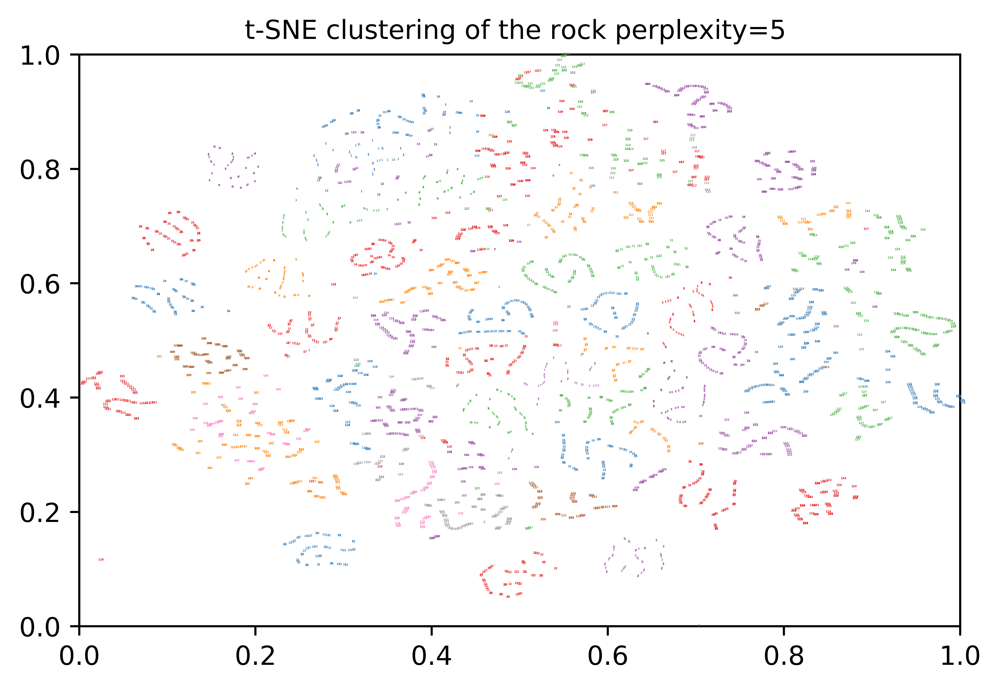

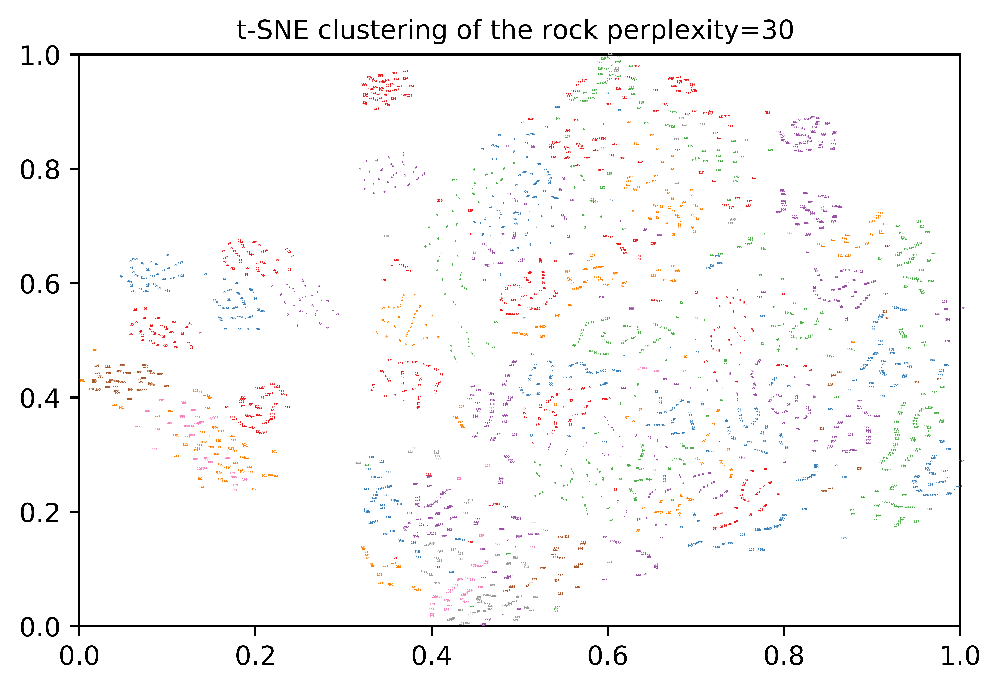

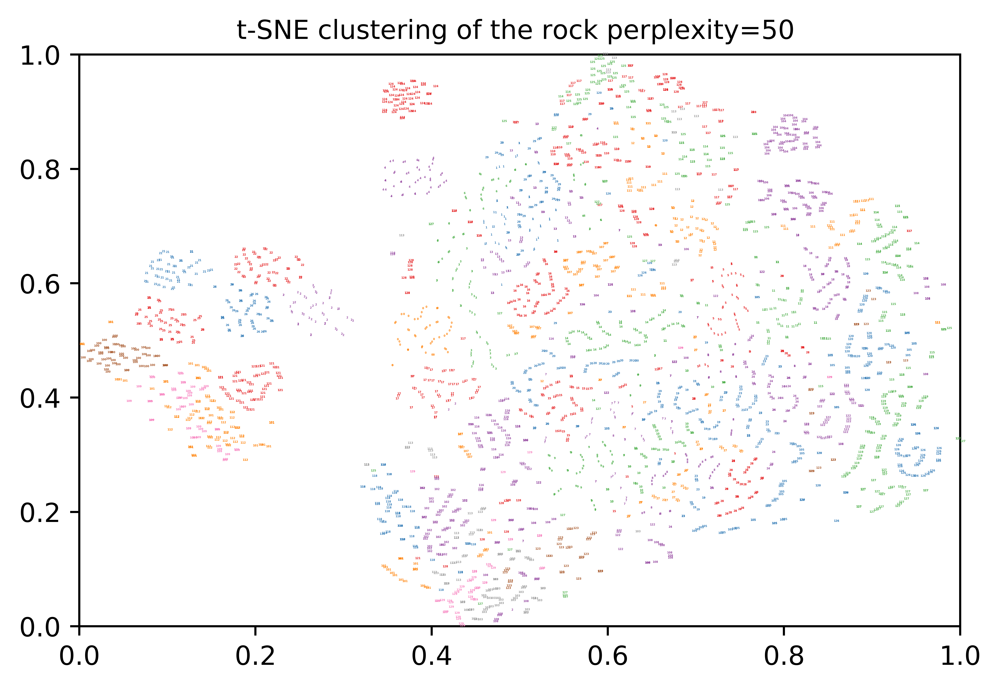

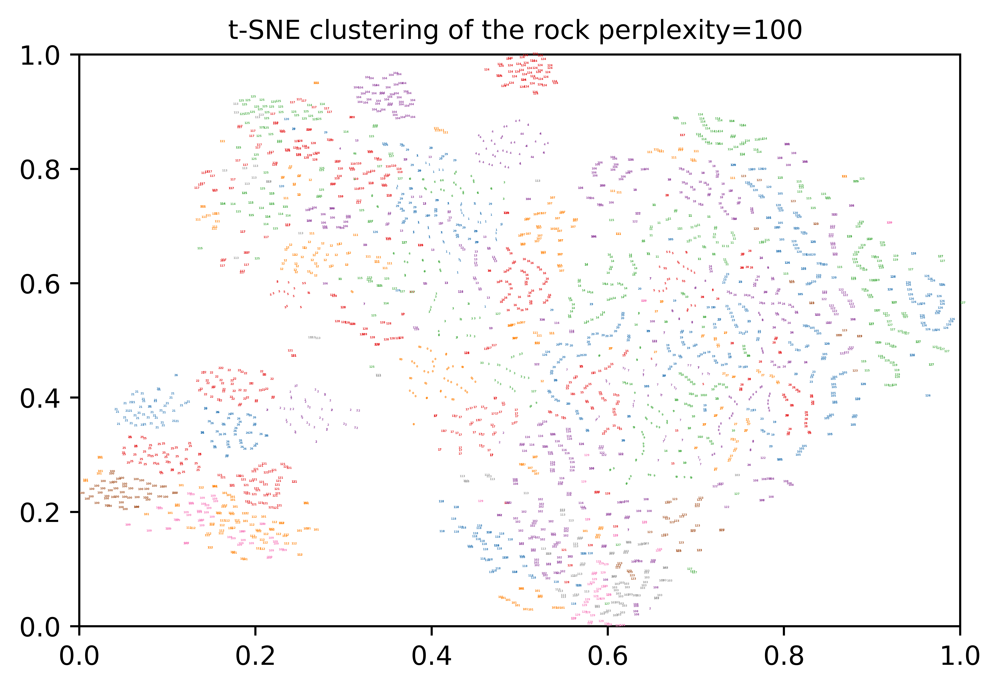

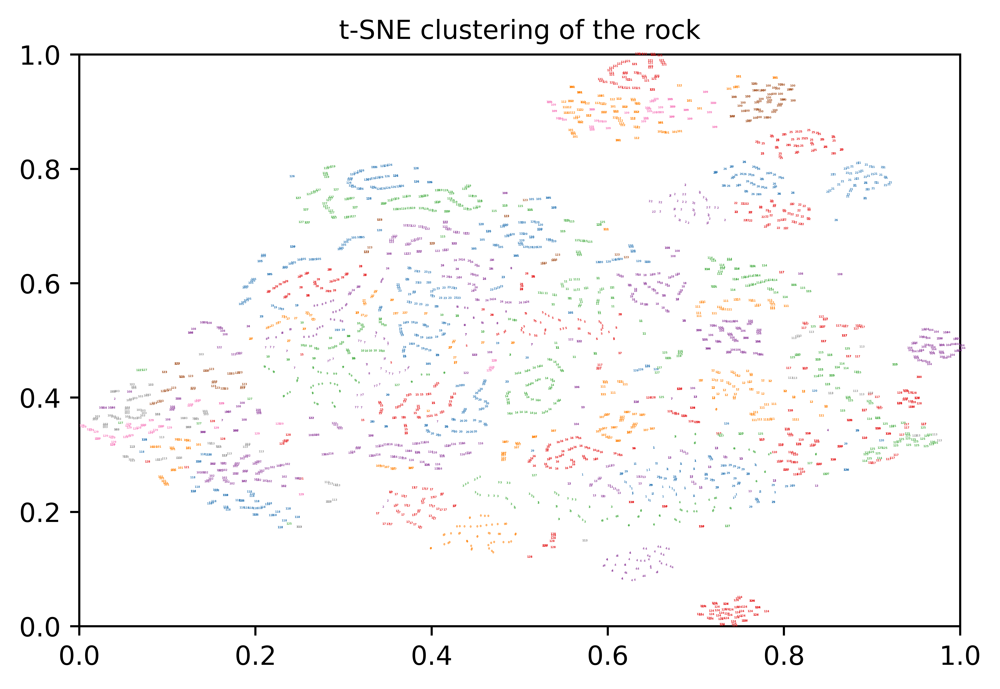

Computing random projection


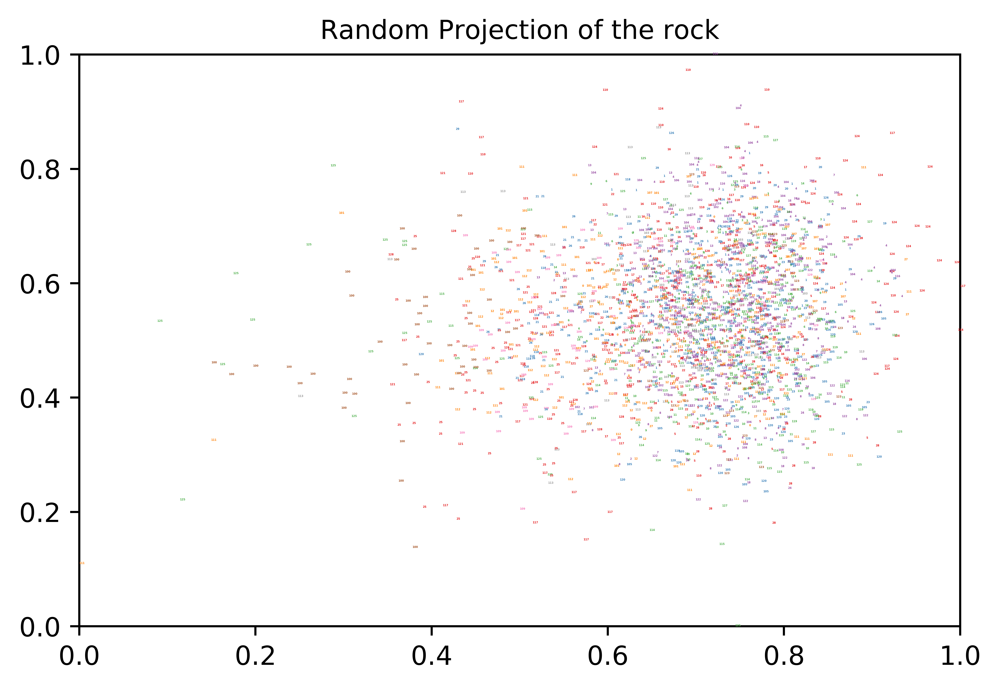

Computing PCA projection


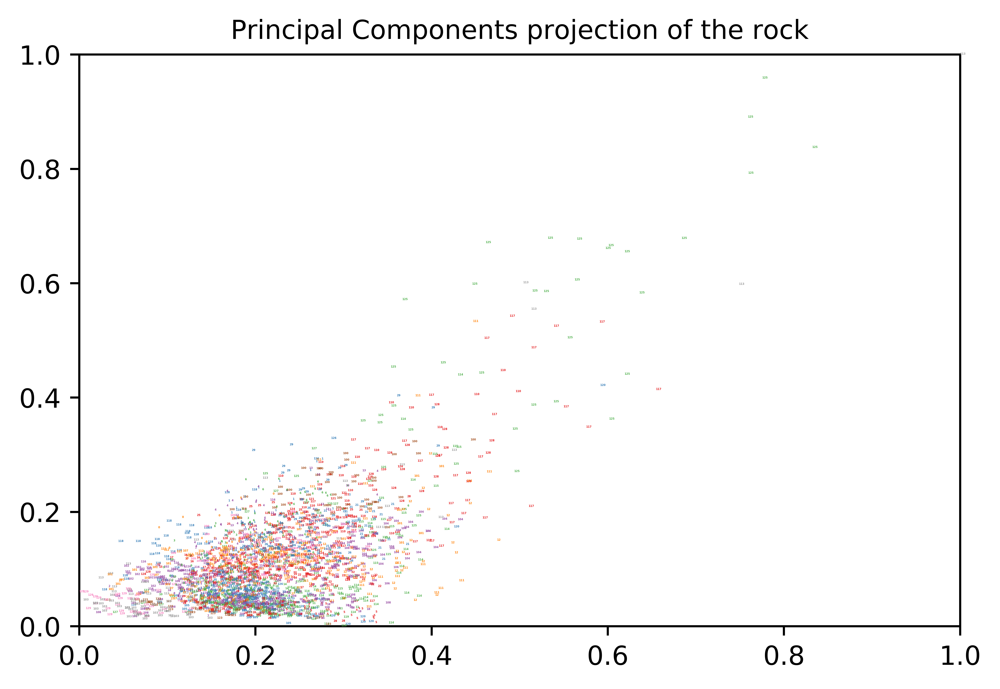

Computing MDS 
Done. Stress: 196257947.103054


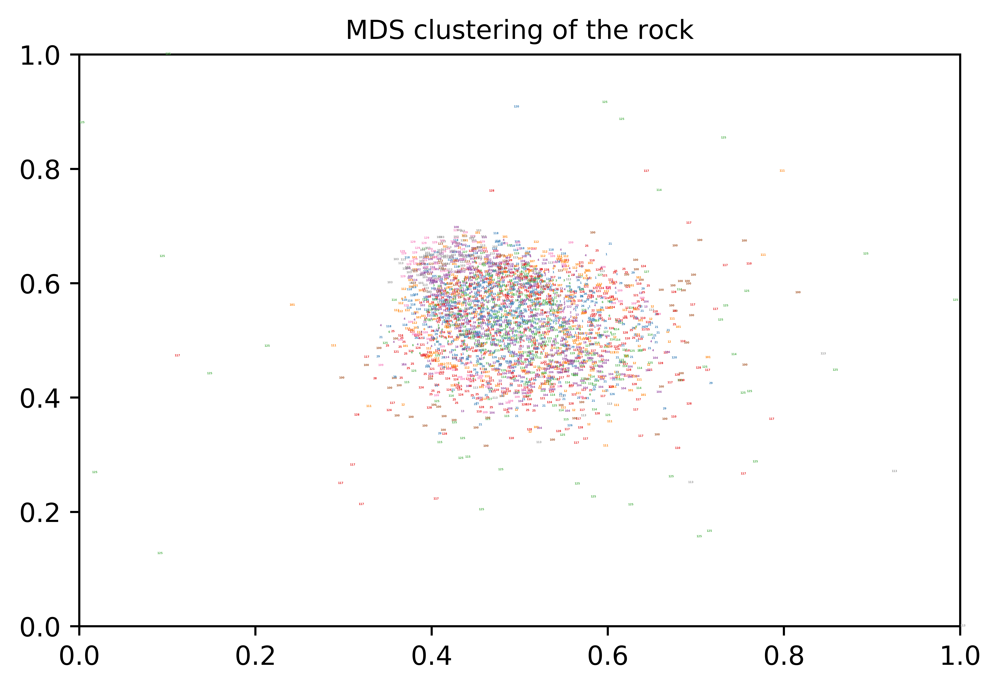

In [58]:
X = None
data_file_path = r'D:\data\SJTU_lab\raw\光谱数据'
for seq, index_i in tqdm_notebook(enumerate(train_position)):
    #temp_sample_type = type_list.index(sample_type[index_i])
    temp_sample_type = seq_num[seq]
    temp_sample_name = sample_name_unique[index_i][1:]
    file = file_names[index_i]+'-1'
    read_path = os.path.join(data_file_path, file)
    for index_j in os.listdir(read_path):
        if not os.path.exists(read_path):
            print(read_path)
            continue
        data_cache = np.loadtxt(os.path.join(read_path, index_j))[:, 1].flatten()
        if X is None:
            X = data_cache
            X0 = temp_sample_type
            X2 = temp_sample_name
        else:
            X = np.row_stack((X, data_cache))
            X0 = np.row_stack((X0, 100+temp_sample_type))
            X2 = np.row_stack((X2, temp_sample_name))
            
data_file_path = r'D:\data\SJTU_lab\powder\光谱数据'
for seq, index_i in tqdm_notebook(enumerate(train_position)):
    temp_sample_type = type_list.index(sample_type[index_i])
    temp_sample_name = seq_num[seq]
    file = file_names[index_i]+'-3'
    read_path = os.path.join(data_file_path, file)
    for index_j in os.listdir(read_path):
        if not os.path.exists(read_path):
            print(read_path)
            continue
        data_cache = np.loadtxt(os.path.join(read_path, index_j))[:, 1].flatten()
        X = np.row_stack((X, data_cache))
        X0 = np.row_stack((X0, temp_sample_type))
        X2 = np.row_stack((X2, temp_sample_name))




# data processing
# ---------------------------------
''''''
min_max_scaler1 = preprocessing.MinMaxScaler()
X1 = min_max_scaler1.fit_transform(X)
''''''
#X1 = X
min_max_scaler2 = preprocessing.MinMaxScaler()
X2 = min_max_scaler2.fit_transform(X2)

# feature selection
fig = plt.figure()

# ---------------------------------
def plot_embedding(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    for i in range(X.shape[0]):
        # print(y_text[i,0])
        plt.text(X[i, 0], X[i, 1],
                 str(X0[i, 0]),
                 color=plt.cm.Set1(X2[i, 0]),
                 fontdict={'weight': 'bold', 'size': 1})
        # print(str(y[i, 0]))
    # plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title, fontsize=10)
    # plt.legend()
    plt.rcParams['figure.dpi'] = 1080 #分辨率
    plt.show()



perplexities = [5, 30, 50, 100]

print("Computing t-SNE clustering")
for i, perplexity in enumerate(perplexities):
    tsne0 = manifold.TSNE(n_components=2, init='random',
                         random_state=0, perplexity=perplexity)
    X_tsne1 = tsne0.fit_transform(X1)
    plot_embedding(X_tsne1, "t-SNE clustering of the rock perplexity=%d " % (perplexity))

tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
X_tsne = tsne.fit_transform(X1)
# ax = fig.add_subplot(441)
plot_embedding(X_tsne, "t-SNE clustering of the rock")

# ----------------------------------------------------------------------
# Random 2D projection using a random unitary matrix
print("Computing random projection")
rp = random_projection.SparseRandomProjection(n_components=2, random_state=5)
X_projected = rp.fit_transform(X1)
plot_embedding(X_projected, "Random Projection of the rock")

# ----------------------------------------------------------------------
# Projection on to the first 2 principal components

print("Computing PCA projection")
X_pca = decomposition.TruncatedSVD(n_components=2).fit_transform(X1)
plot_embedding(X_pca,
               "Principal Components projection of the rock")

# MDS  embedding of the digits dataset
print("Computing MDS ")
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100)
X_mds = clf.fit_transform(X1)
print("Done. Stress: %f" % clf.stress_)
plot_embedding(X_mds,
               "MDS clustering of the rock")


In [53]:
type_list.index(sample_type[index_i])

29

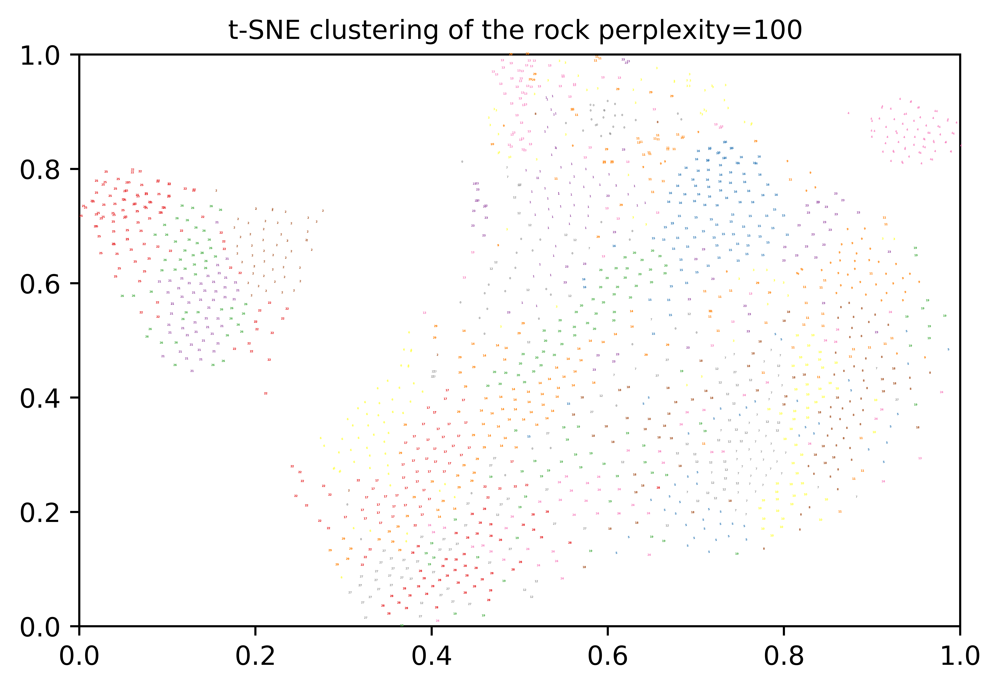

In [44]:
def plot_embedding(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    for i in range(X.shape[0]):
        # print(y_text[i,0])
        plt.text(X[i, 0], X[i, 1],
                 str(X0[i, 0]),
                 color=plt.cm.Set1(X2[i, 0]),
                 fontdict={'weight': 'bold', 'size': 1})
        # print(str(y[i, 0]))
    # plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title, fontsize=10)
    # plt.legend()
    plt.rcParams['figure.dpi'] = 1080 #分辨率
    plt.show()
plot_embedding(X_tsne1,
               "t-SNE clustering of the rock perplexity=%d " % (perplexity))

In [47]:
X_tsne1.shape

(3000, 2)

Computing t-SNE clustering


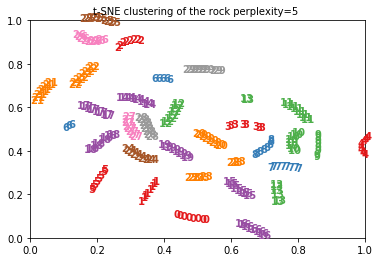

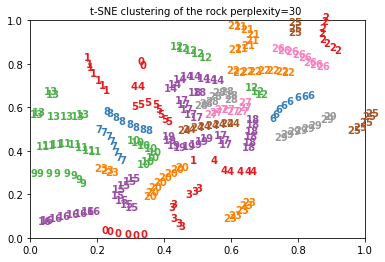

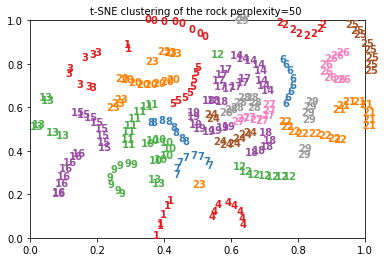

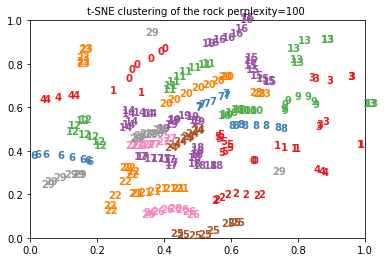

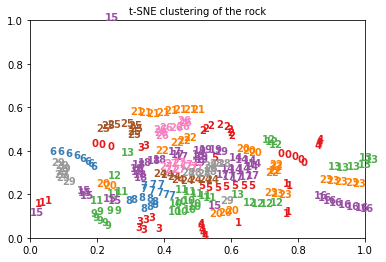

Computing random projection


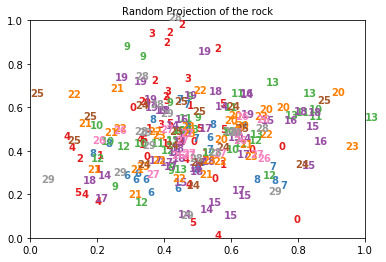

Computing PCA projection


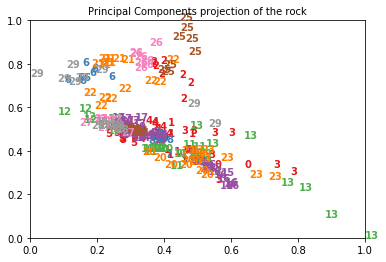

Computing MDS 
Done. Stress: 660053141.946854


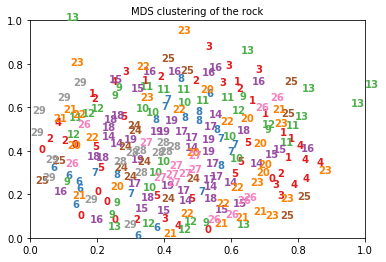

In [2]:
# _*_ coding:utf-8 _*_
import numpy as np
import os
import xlrd
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm_notebook
from sklearn.model_selection import StratifiedKFold
from sklearn import preprocessing
from matplotlib import offsetbox
from sklearn import (manifold, datasets, decomposition, ensemble,
                     discriminant_analysis, random_projection)


date = '20191230'
data_file_path = r'D:\data\SJTU_lab\coeffs_cwt\coeffs_diff'
menu_guide_path = r'D:\data\Menu_Guide-quantitative.xlsx'
#process_path = ['DenoisedSpectrum', 'SmoothedSpectrum']
choose_type = 'Soil_Type'
file_list = 'Spectra_Name'
sample_list = 'Spectra_Name'
data_flag = pd.read_excel(menu_guide_path)
file_names = np.array(data_flag[file_list])
sample_type = np.array(data_flag[choose_type])
sample_name_unique = np.array(data_flag[sample_list])
train_test_set = np.array(data_flag['Train']).tolist()
type_list = data_flag[choose_type].drop_duplicates(keep='first').tolist()
p = 150  #p可调

########################################################################################################################
# train list
train_position = [i for i, j in enumerate(train_test_set) if j == 1]
# mark the sequence number according to std
file_path = r'D:\data\SJTU_lab\raw\光谱数据'
std = []
for index_i in train_position:
    file = file_names[index_i]+'-1'+'.txt'
    read_path = os.path.join(data_file_path, file)
    X = None
    for index_j in os.listdir(read_path):
        if X is None:
            X = np.loadtxt(os.path.join(read_path, index_j)).flatten()
        else:
            X = np.row_stack((X, np.loadtxt(os.path.join(read_path, index_j)).flatten()))
    std.append(np.std(X, axis=0))
seq_num = np.argsort(std)

X = None
for index_i in train_position:
    temp_sample_type = type_list.index(sample_type[index_i])
    temp_sample_name = sample_name_unique[index_i][1:]
    for j in range(8):
        file = file_names[index_i]+'_'+str(j)+'.txt'
        read_path = os.path.join(data_file_path, file)
        if not os.path.exists(read_path):
            print(read_path)
            continue
        data_cache = np.loadtxt(read_path)
        data_cache = data_cache.flatten()
        if X is None:
            X = data_cache
            X0 = temp_sample_type
            X2 = temp_sample_name
        else:
            X = np.row_stack((X, data_cache))
            X0 = np.row_stack((X0, temp_sample_type))
            X2 = np.row_stack((X2, temp_sample_name))




# data processing
# ---------------------------------
''''''
min_max_scaler1 = preprocessing.MinMaxScaler()
X1 = min_max_scaler1.fit_transform(X)
''''''
#X1 = X
min_max_scaler2 = preprocessing.MinMaxScaler()
X2 = min_max_scaler2.fit_transform(X2)

# feature selection
fig = plt.figure()

# ---------------------------------
def plot_embedding(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    for i in range(X.shape[0]):
        # print(y_text[i,0])
        plt.text(X[i, 0], X[i, 1],
                 str(X0[i, 0]),
                 color=plt.cm.Set1(X2[i, 0]),
                 fontdict={'weight': 'bold', 'size': 10})
        # print(str(y[i, 0]))
    # plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title, fontsize=10)
    # plt.legend()
    plt.show()



perplexities = [5, 30, 50, 100]

print("Computing t-SNE clustering")
for i, perplexity in enumerate(perplexities):
    tsne0 = manifold.TSNE(n_components=2, init='random',
                         random_state=0, perplexity=perplexity)
    X_tsne1 = tsne0.fit_transform(X1)
    plot_embedding(X_tsne1, "t-SNE clustering of the rock perplexity=%d " % (perplexity))

tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
X_tsne = tsne.fit_transform(X1)
# ax = fig.add_subplot(441)
plot_embedding(X_tsne, "t-SNE clustering of the rock")

# ----------------------------------------------------------------------
# Random 2D projection using a random unitary matrix
print("Computing random projection")
rp = random_projection.SparseRandomProjection(n_components=2, random_state=5)
X_projected = rp.fit_transform(X1)
plot_embedding(X_projected, "Random Projection of the rock")

# ----------------------------------------------------------------------
# Projection on to the first 2 principal components

print("Computing PCA projection")
X_pca = decomposition.TruncatedSVD(n_components=2).fit_transform(X1)
plot_embedding(X_pca,
               "Principal Components projection of the rock")

# MDS  embedding of the digits dataset
print("Computing MDS ")
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100)
X_mds = clf.fit_transform(X1)
print("Done. Stress: %f" % clf.stress_)
plot_embedding(X_mds,
               "MDS clustering of the rock")







